### Integrating myeloid cells from all my OC datasets

In [1]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration')
getwd()

[1] "/scratch/user/s4436039/Nikita-project"

[1] "/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration"

In [2]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [3]:
# import all datasets
data_1 <- readRDS(file = "/scratch/user/s4436039/scdata/Myeloid_Cells/Myeloid_Cells_Integrate/GSE161529_myeloid_int.RDS")
data_2 <- readRDS(file = "/scratch/user/s4436039/scdata/Myeloid_Cells/Myeloid_Cells_Integrate/GSE176078_myeloid_int.RDS")
data_3 <- readRDS(file = "/scratch/user/s4436039/scdata/Myeloid_Cells/Myeloid_Cells_Integrate/GSE195861_myeloid_int.RDS")
data_4 <- readRDS(file = "/scratch/user/s4436039/scdata/Myeloid_Cells/Myeloid_Cells_Integrate/GSE199515_myeloid_int.RDS")
data_5 <- readRDS(file = "/scratch/user/s4436039/scdata/Myeloid_Cells/Myeloid_Cells_Integrate/GSE225600_myeloid_int.RDS")

data_6 <- readRDS(file = "/scratch/user/s4436039/scdata/Myeloid_Cells/Myeloid_Cells_Integrate/PMID32561858_myeloid_int.RDS")

In [4]:
table(data_6@meta.data$cancer_subtype)


Breast Cancer           CRC            NA 
         3066          2997          1056 

In [5]:
data_6 <- subset(data_6, subset = cancer_subtype %in% c("Breast Cancer"))

In [12]:
table(data_6@meta.data$cancer_subtype)


Breast Cancer 
         3066 

In [13]:
#merge all datasets
Data <- merge(data_1, y = c(data_2, data_3, data_4, data_5, data_6), project = "integration_BRE")

In [14]:
#Export integrated RDS so it can be loaded in without running above 
saveRDS(Data, "/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration/BRE_Myeloid.RDS")

In [4]:
#Read in data
#Data <- readRDS(file = "/scratch/user/s4436039/scdata/OC_Myeloid.RDS")

In [15]:
Data

An object of class Seurat 
49646 features across 50996 samples within 1 assay 
Active assay: RNA (49646 features, 2000 variable features)
 186 layers present: counts.GSE161529_ER_breast_ER0029.GSE161529, counts.GSE161529_BRCA1_TNBC_0177.GSE161529, counts.GSE161529_BRCA1_TNBC_0554.GSE161529, counts.GSE161529_ER_breast_ER0001.GSE161529, counts.GSE161529_ER_breast_ER0025.GSE161529, counts.GSE161529_ER_breast_ER0032.GSE161529, counts.GSE161529_ER_breast_ER0040.GSE161529, counts.GSE161529_ER_breast_ER0042.GSE161529, counts.GSE161529_ER_breast_ER0043.GSE161529, counts.GSE161529_ER_breast_ER0064.GSE161529, counts.GSE161529_ER_breast_ER0114.GSE161529, counts.GSE161529_ER_breast_ER0125.GSE161529, counts.GSE161529_ER_breast_ER0151.GSE161529, counts.GSE161529_ER_breast_ER0163.GSE161529, counts.GSE161529_ER_breast_ER0167.GSE161529, counts.GSE161529_ER_breast_ER0173.GSE161529, counts.GSE161529_ER_breast_ER0319.GSE161529, counts.GSE161529_ER_breast_ER0360.GSE161529, counts.GSE161529_ER_breast_mets_E

In [16]:
#Normalise the data
Data <- NormalizeData(Data)

Normalizing layer: counts.GSE161529_ER_breast_ER0029.GSE161529

Normalizing layer: counts.GSE161529_BRCA1_TNBC_0177.GSE161529

Normalizing layer: counts.GSE161529_BRCA1_TNBC_0554.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0001.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0025.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0032.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0040.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0042.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0043.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0064.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0114.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0125.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0151.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0163.GSE161529

Normalizing layer: counts.GSE161529_ER_breast_ER0167.GSE161529

Normalizing layer: counts.GSE161529_ER_bre

In [10]:
#Find variable features below took 171m

In [17]:
#Find variable features
Data <- FindVariableFeatures(Data)

Finding variable features for layer counts.GSE161529_ER_breast_ER0029.GSE161529

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -2.3181”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  2.7171e-16”
Finding variable features for layer counts.GSE161529_BRCA1_TNBC_0177.GSE161529

Finding variable features for layer counts.GSE161529_BRCA1_TNBC_0554.GSE161529

Finding variable features for layer counts.GSE161529_ER_breast_ER0001.GSE161529

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -2.6763”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.49827”
Warning message in simpleLoess(y, x, w, span, degree = degree,

In [13]:
#save below took 5min

In [18]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(Data, "/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration/BRE_Myeloid_2.RDS")

In [19]:
#Scale the data
Data <- ScaleData(Data)

Centering and scaling data matrix



In [20]:
#Run pca
Data <- RunPCA(Data)

PC_ 1 
Positive:  MGP, AZGP1, PIP, WFDC2, TFF3, KRT19, DSP, KRT18, GATA3, ANKRD30A 
	   KRT8, FXYD3, PTN, SLC12A2, PLAT, KRT7, MDK, KIAA1324, TPM1, SLC39A6 
	   EPCAM, MGST1, AGR3, XBP1, SFRP1, AGR2, CDH1, CRNDE, SMIM22, PTPRF 
Negative:  CD74, FTL, CTSB, CD68, HLA-DRA, DUSP1, HLA-DRB1, PSAP, HLA-DPA1, CTSS 
	   FCGR3A, LYZ, SH3BGRL3, HLA-DPB1, HLA-DQB1, SOD2, HLA-DQA1, PLAUR, CTSC, ACTB 
	   C1QA, JUNB, NR4A2, MS4A7, TNFSF13B, MS4A6A, HLA-DRB5, GRN, C1QB, FTH1 
PC_ 2 
Positive:  CD81, LDHB, TUBB, P4HB, ANXA2, HSP90B1, CALR, PDIA6, CD59, PRDX1 
	   CD151, PTMS, HSP90AB1, ENO1, NUCKS1, RAN, ACTG1, HMGB1, PKM, DEK 
	   PARP1, HSPA5, SLC25A5, APP, CCT6A, LAMP1, CCND1, CD63, PA2G4, SPINT2 
Negative:  CFP, S100A12, FCN1, VCAN, CXCL8, LGALS2, S100A8, IGKC, COL1A1, FCER1A 
	   COL3A1, COL1A2, CD300E, CXCR4, IL1B, CCR7, IL1R2, JAML, NLRP3, CCL20 
	   CD52, MIR3945HG, LAMP3, CD1C, EREG, APOBEC3A, MCEMP1, IGHA1, CCL19, IGLC2 
PC_ 3 
Positive:  CD55, PPP1R15A, KDM6B, BTG1, IL1B, NFKBIA, TNFAIP3, 

In [21]:
#Find neighbours 
Data <- FindNeighbors(Data, dims = 1:30, reduction = "pca")

Computing nearest neighbor graph

Computing SNN



In [23]:
#Cluster
Data <- FindClusters(Data, resolution = 0.2, cluster.name = "unintegrated_clusters")

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 50996
Number of edges: 1721637

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9386
Number of communities: 18
Elapsed time: 9 seconds


1 singletons identified. 17 final clusters.



In [24]:
#Run UMAP
Data <- RunUMAP(Data, dims = 1:30, reduction = "pca", reduction.name = "umap.unintegrated", verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


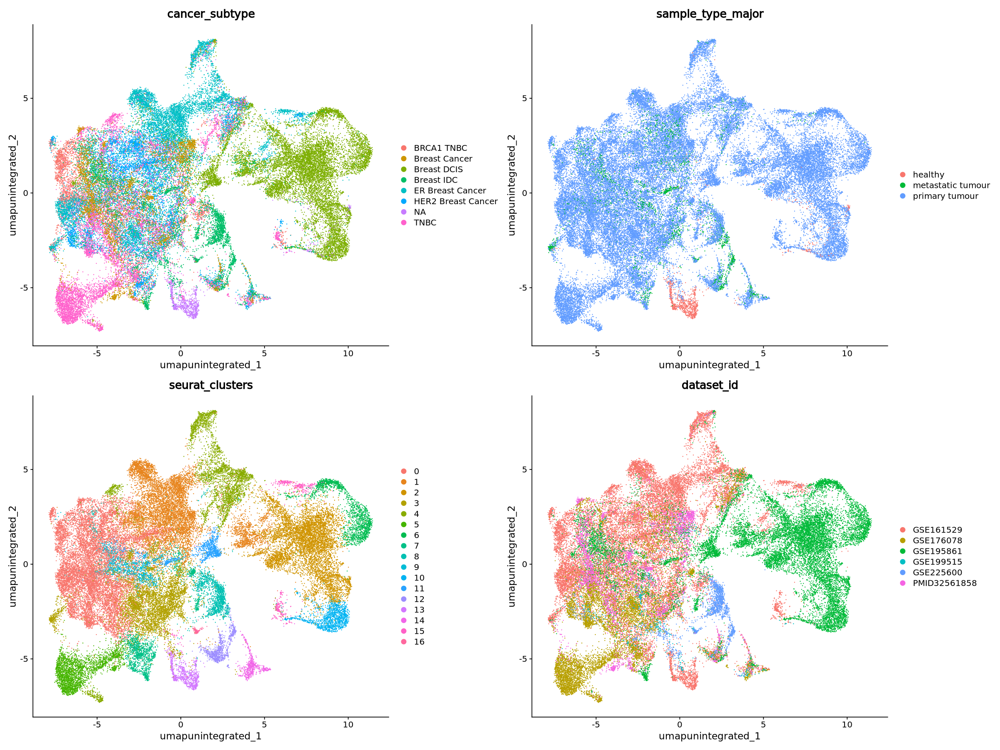

In [25]:
options(repr.plot.height=15, repr.plot.width=20)
DimPlot(Data, reduction = "umap.unintegrated", group.by = c("cancer_subtype", "sample_type_major", "seurat_clusters", "dataset_id"))

In [26]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(Data, "/scratch/user/s4436039/scdata/BRE_Myeloid_3.RDS")

In [3]:
#Read in data
#Data <- readRDS(file = "/scratch/user/s4436039/scdata/BRE_Myeloid_3.RDS")

In [ ]:
#now try with integration 

In [27]:
library(harmony)

Loading required package: Rcpp



In [28]:
Data <- IntegrateLayers(object = Data, method = HarmonyIntegration, orig.reduction = "pca", new.reduction = "integrated.harmony", verbose = FALSE)

Warning message:
“HarmonyMatrix is deprecated and will be removed in the future from the API in the future”
Warning message:
“Warning: The parameters do_pca and npcs are deprecated. They will be ignored for this function call and please remove parameters do_pca and npcs and pass to harmony cell_embeddings directly.
This warning is displayed once per session.”
Warning message:
“Warning: The parameter tau is deprecated. It will be ignored for this function call and please remove parameter tau in future function calls. Advanced users can set value of parameter tau by using parameter .options and function harmony_options().
This warning is displayed once per session.”
Warning message:
“Warning: The parameter block.size is deprecated. It will be ignored for this function call and please remove parameter block.size in future function calls. Advanced users can set value of parameter block.size by using parameter .options and function harmony_options().
This warning is displayed once per sessi

In [29]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(Data, file = "/scratch/user/s4436039/scdata/Integrated_BRE_1.RDS")

In [3]:
#Read in data
#Data <- readRDS(file = "/scratch/user/s4436039/scdata/Integrated_OC_1.RDS")

In [30]:
# re-join layers after integration
Data[["RNA"]] <- JoinLayers(Data[["RNA"]])

In [31]:
Data <- FindNeighbors(Data, reduction = "integrated.harmony", dims = 1:30)

Computing nearest neighbor graph

Computing SNN



In [32]:
Data <- FindClusters(Data, resolution = 0.2, cluster.name = "integrated_clusters")

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 50996
Number of edges: 2034938

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9445
Number of communities: 15
Elapsed time: 13 seconds


In [33]:
#Run UMAP
Data <- RunUMAP(Data, dims = 1:30, reduction = "integrated.harmony", reduction.name = "umap.integrated", verbose = FALSE)

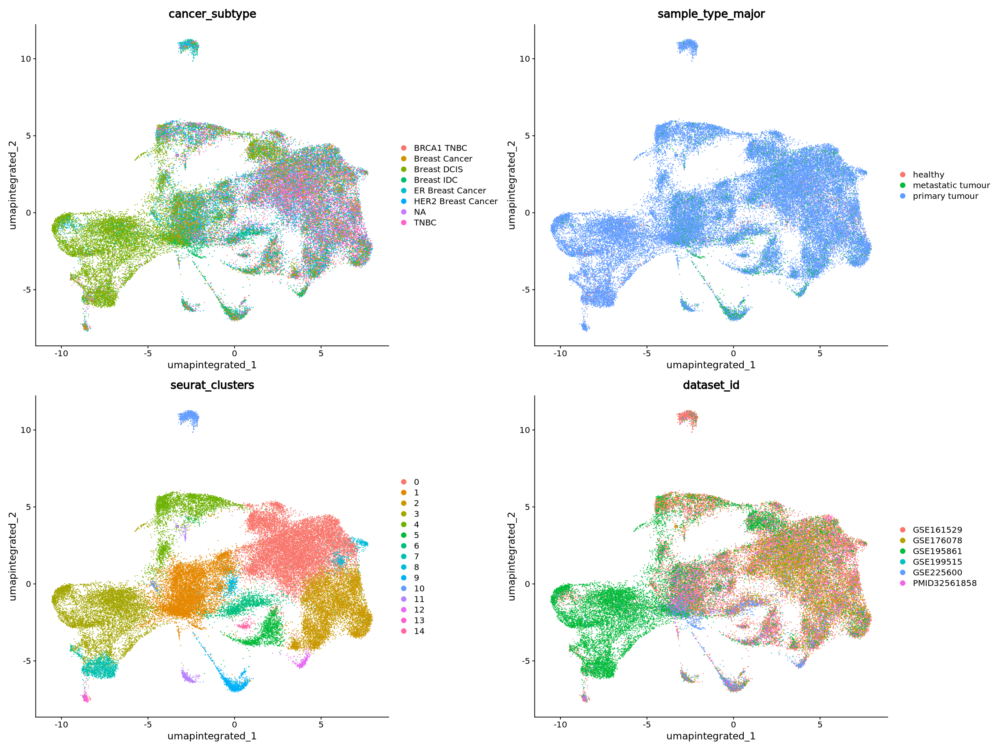

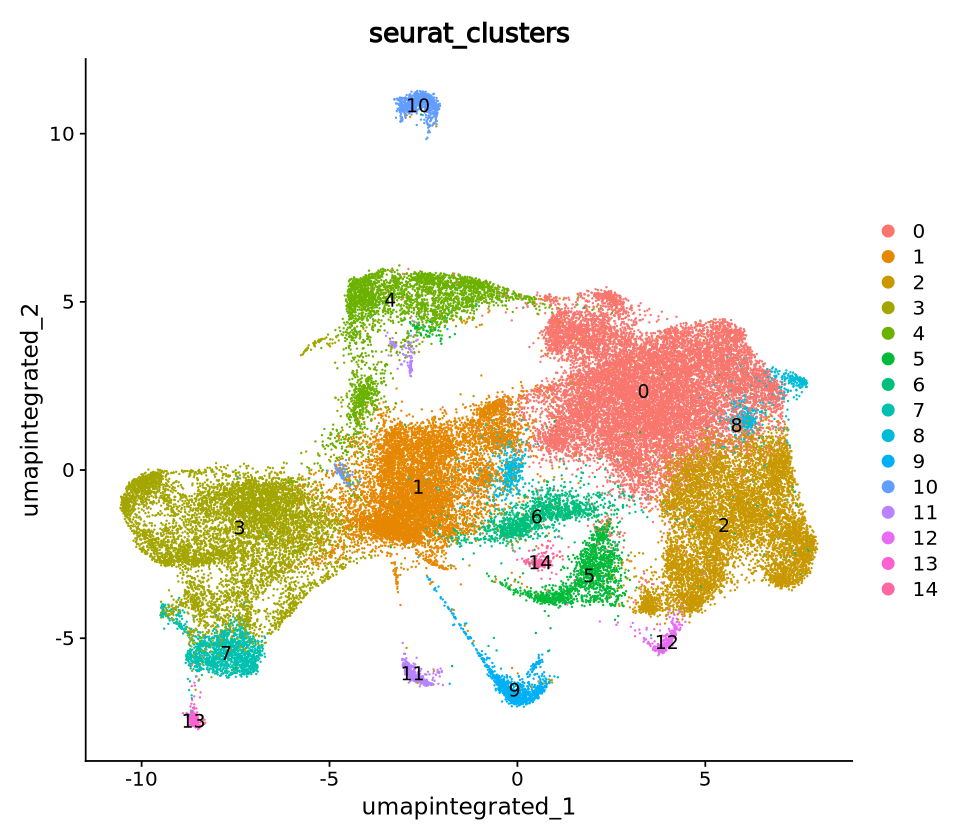

In [34]:
options(repr.plot.height=15, repr.plot.width=20)
DimPlot(Data, reduction = "umap.integrated", group.by = c("cancer_subtype", "sample_type_major", "seurat_clusters", "dataset_id"), label = FALSE)
options(repr.plot.height=7, repr.plot.width=8)
DimPlot(Data, reduction = "umap.integrated", group.by = c("seurat_clusters"), label = TRUE)

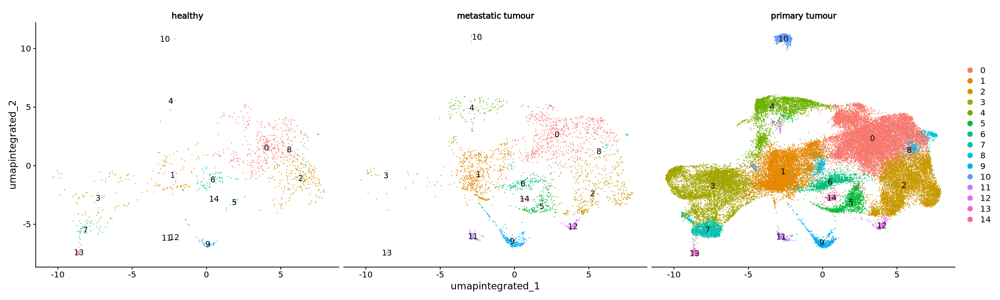

In [38]:
options(repr.plot.height=6, repr.plot.width=20)
DimPlot(Data, reduction = "umap.integrated", split.by = c("sample_type_major"), label = TRUE)

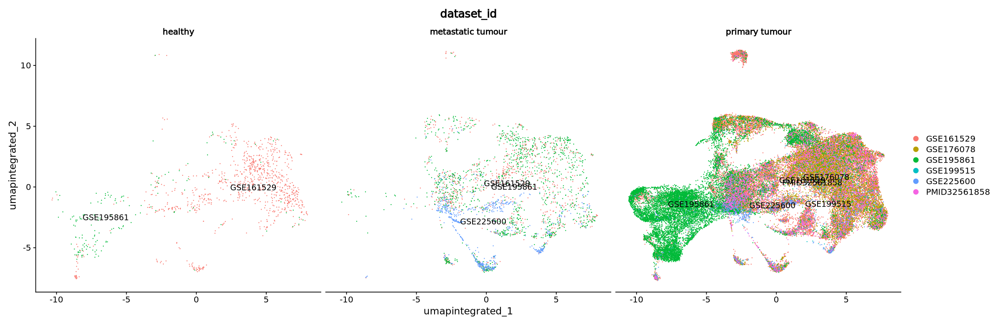

In [39]:
options(repr.plot.height=6.5, repr.plot.width=20)
DimPlot(Data, reduction = "umap.integrated", group.by = c("dataset_id"), split.by = c("sample_type_major"), label = TRUE)

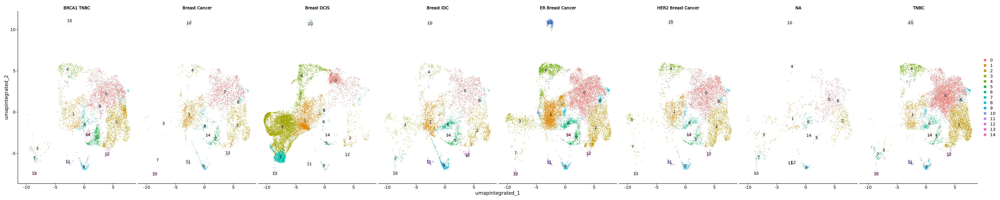

In [43]:
options(repr.plot.height=8, repr.plot.width=40)
DimPlot(Data, reduction = "umap.integrated", split.by = c("cancer_subtype"), label = TRUE)

In [44]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(Data, file = "/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration/Integrated_BRE_2.RDS")

In [3]:
#Read in data
Data <- readRDS(file = "/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration/Integrated_BRE_2.RDS")

In [ ]:
#next section about annotating myeloid clusters

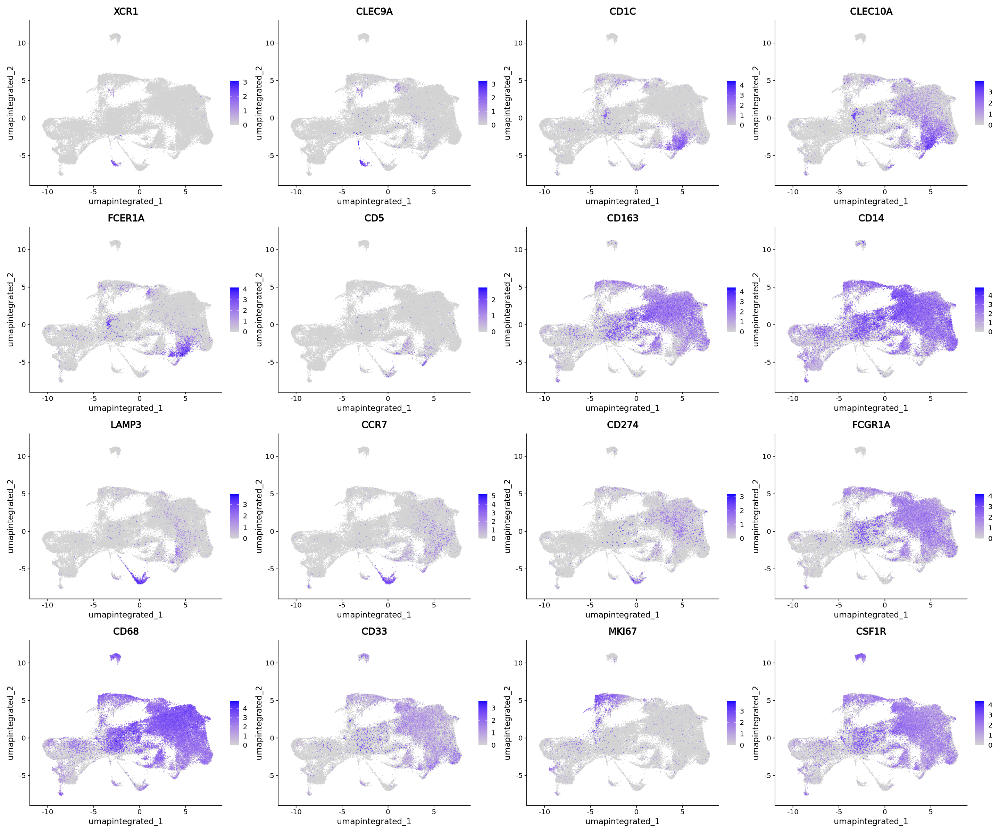

In [4]:
options(repr.plot.height=20, repr.plot.width=24)
FeaturePlot(Data, reduction = "umap.integrated", features = c("XCR1", "CLEC9A", "CD1C", "CLEC10A", "FCER1A", "CD5", "CD163", "CD14", "LAMP3", "CCR7", "CD274", "FCGR1A", "CD68", "CD33", "MKI67", "CSF1R"), order = TRUE)

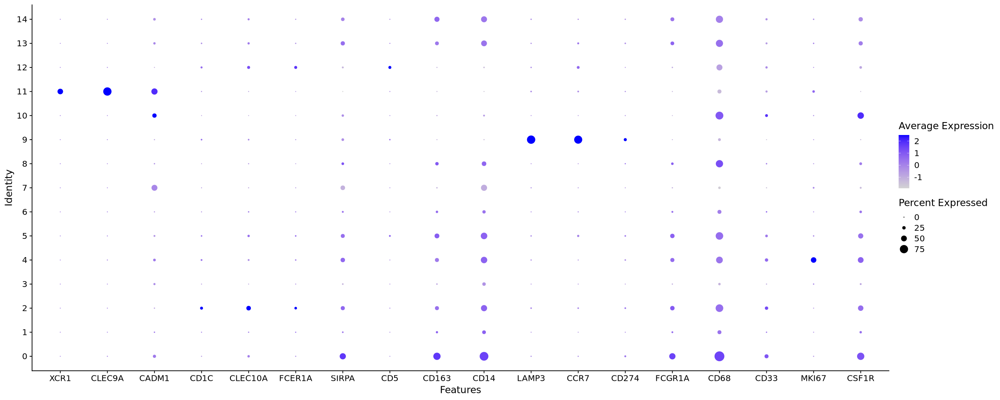

In [5]:
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(Data, features = c("XCR1", "CLEC9A", "CADM1", "CD1C", "CLEC10A", "FCER1A", "SIRPA", "CD5", "CD163", "CD14", "LAMP3", "CCR7", "CD274", "FCGR1A", "CD68", "CD33", "MKI67", "CSF1R"))

In [6]:
# Get number of cells per cluster and per sample of origin
table(Data@meta.data$`integrated_clusters`, Data@meta.data$sample_type_major)

    
     healthy metastatic tumour primary tumour
  0      410               657          13509
  1      100               585           8101
  2      243               419           7673
  3       90                35           7385
  4        5               114           3222
  5       10               179           1340
  6       62               155           1288
  7       34                 0           1355
  8       17                33           1001
  9       36               271            621
  10       4                11            730
  11       6                83            435
  12       1                82            253
  13      14                 4            219
  14       2                13            189

In [ ]:
#next finding markers from every cluster compared to all other cells, reporting only the positive ones

In [7]:
BRE.markers <- FindAllMarkers(Data, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14



In [8]:
library(dplyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [10]:
BRE.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,1.921599,0.758,0.218,0,0,GPNMB
0,1.749633,0.776,0.244,0,0,DAB2
0,1.606036,0.840,0.313,0,0,CTSL
0,1.301582,0.729,0.214,0,0,MSR1
0,1.941331,0.659,0.145,0,0,SLCO2B1
0,1.481138,0.785,0.277,0,0,FCGR3A
0,1.942740,0.910,0.403,0,0,C1QC
0,1.936047,0.767,0.261,0,0,LGMN
0,1.596498,0.832,0.327,0,0,MS4A7


In [11]:
# top 20 genes for each cluster
top20cluster_BRE_int <- BRE.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 20) %>%
    ungroup() -> top20

In [12]:
top20cluster_BRE_int
write.csv(top20cluster_BRE_int,"BRE_int_top20cluster.csv") 

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.921599,0.758,0.218,0.000000e+00,0,GPNMB
0.000000e+00,1.749633,0.776,0.244,0.000000e+00,0,DAB2
0.000000e+00,1.606036,0.840,0.313,0.000000e+00,0,CTSL
0.000000e+00,1.301582,0.729,0.214,0.000000e+00,0,MSR1
0.000000e+00,1.941331,0.659,0.145,0.000000e+00,0,SLCO2B1
0.000000e+00,1.481138,0.785,0.277,0.000000e+00,0,FCGR3A
0.000000e+00,1.942740,0.910,0.403,0.000000e+00,0,C1QC
0.000000e+00,1.936047,0.767,0.261,0.000000e+00,0,LGMN
0.000000e+00,1.596498,0.832,0.327,0.000000e+00,0,MS4A7


In [13]:
library(ggplot2)

Warning message in DoHeatmap(subset(Data, downsample = 300), features = top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: JSRP1, FCRL5, POU2AF1, IGHGP, TNFRSF17, AEBP1, ADGRF5, RUNX1T1, MFAP4, SEMA5A, CDH11, PLAC9, COL5A2, CAVIN3, GABRP, AL021155.5, Z99127.4, SNHG5, PCLAF, TFF1, SRGN, LST1, MYO15B, NCK1-DT, AL627171.2, HIST2H2AC, MEF2C”


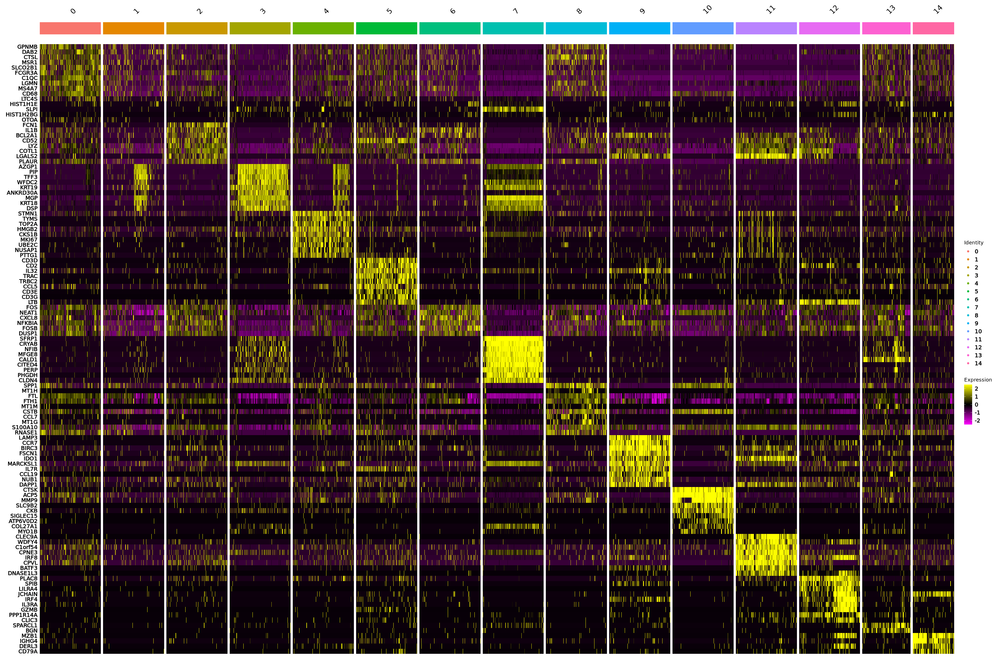

In [14]:
options(repr.plot.height=20, repr.plot.width=30)

BRE.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10
DoHeatmap(subset(Data, downsample = 300), features = top10$gene) +
theme(axis.text.y = element_text(size = 12)) +
theme(axis.text.y = element_text(face = "bold")) +
theme(axis.text.y = element_text(colour = "black")) +
theme(legend.text = element_text(size = 12)) +
theme(legend.text = element_text(face = "bold"))

In [ ]:
#annotate the clusters and make figure

In [57]:
#new.cluster.ids <- c(" ", " ", " ", " ", " ", " "," "," "," "," "," "," ")
#names(new.cluster.ids) <- levels(Data)
#Data <- RenameIdents(Data, new.cluster.ids)


In [20]:
#options(repr.plot.height=10, repr.plot.width=10)
#DimPlot(Data, reduction = "umap.integrated", label = TRUE) + NoLegend()

In [ ]:
# now working with my signatures

In [15]:
#make an object with my sigs (up and down regulated genes in Ag+ compared to DLL1) - see excel file Nikita-mregDC_DEG_summary on i drive

Up_sig <- list(c('CCL22','IL4I1','SIRPA','CCR7','CHST11','GPR157','RGS1','BIRC3','TRAF1','CSF2RA','TBC1D13','LAMP3','MREG','PPP1R14A','SPRED2','CD83','TXN','MOB3A','NFKB1','TBC1D4','CDK2','WFDC21P','ARAP2','ZER1','ACSL1','SPINT2','SQSTM1','TBC1D8','JAG1','AC073508.3','BATF','ETV3','BCL2','KIF2A','FSCN1','TNFAIP3','CCDC28B','NR4A3','CYTIP','PLEK','FOXO1','TOMM34','TRAFD1','PPP1R16B','CXCR4','CD40','ENTPD7','CDKN1A','BID','MARCKS','DUSP5','MAP4K4','BCL2L1','ISG20','RNF145','RNF121','GPR132','RASGEF1B','CYRIA','RAB10','CERS6','IL1R1','STK4','CLEC2D','AL390719.1','ZBTB38','IFNGR2','CD274','SLC41A2','NRP2','ANKRD33B','GPR183','POGLUT1','ADORA2A','JADE3','KHDRBS3','CTNNB1','SLCO5A1','NFKB2','RGS2','SEC61B','ZNRF1','RELB','C12orf45','IRF2','EPOP','MXD1','RAB5B','PADI2','DRAM1','MTMR4','EEF2K','GCNT2','RAPH1','BCL2A1','SEC23B','PIM3','ANTXR2','ABTB2','TMEM200A'))
Down_sig <- list(c('MYBL1','GPD1L','STX10','APOBEC3C','CAMK2G','ADA','DGLUCY','FOSB','PAQR8','BANK1','RGS18','GNAI1','C20orf27','BIN2','MAP2K6','COL4A4','ATM','DISC1','VPS26B','NDRG3','FES','STEAP3','SUZ12P1','CYP2E1','MAML3','SMARCA2','PTPN18','RFXAP','THYN1','MAPRE2','AIM2','CARD8','PDLIM2','MPPE1','PLCB2','NCALD','LMO4','SCN9A','TMED3','GCC2','RAVER2','PYCARD','CLNK','PECAM1','CCDC86','TTC39C','ATP5IF1','FYB1','MYLK','IMPA2','HHEX','ELK3','CHDH','TARBP1','WDFY2','ASPHD2','CCDC74A','RGS14','TFDP2','FAM78A','KCTD12','FGL2','FKBP1B','COQ8A','IFI16','ADAM28','RGS19','INTS10','TBC1D5','RPS6KA5','KIF20B','ARHGDIB','HVCN1','NAIP','DUSP7','BCKDHB','FOXRED2','TTC8','SLC12A9','PDK2','CCDC125','FAM117B','SPIN3','NUP210','TMEM109','METTL17','GRK6','ALAD','SCRN1','AC046185.3','ABHD11','TTLL1','GALK1','FAM8A1','GPT2','ADRB2','CCR2','PHETA1','LMO2','DBNDD2'))


In [16]:
#calculate module score
Data <- AddModuleScore(
  object = Data,
  features = Up_sig,
  name = "Up_sig_enriched"
)

Data <- AddModuleScore(
  object = Data,
  features = Down_sig,
  name = "Down_sig_enriched"
)

Warning message:
“The following features are not present in the object: WFDC21P, CYRIA, AL390719.1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: SUZ12P1, AC046185.3, not searching for symbol synonyms”


In [17]:
library(viridis)

Loading required package: viridisLite



Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


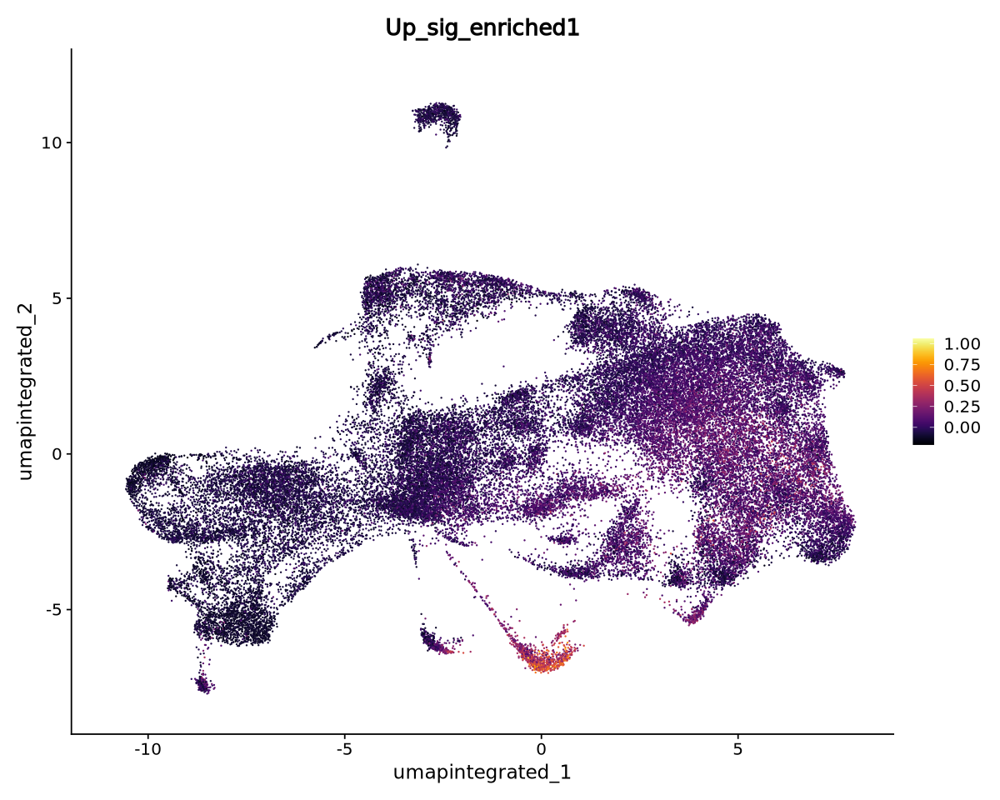

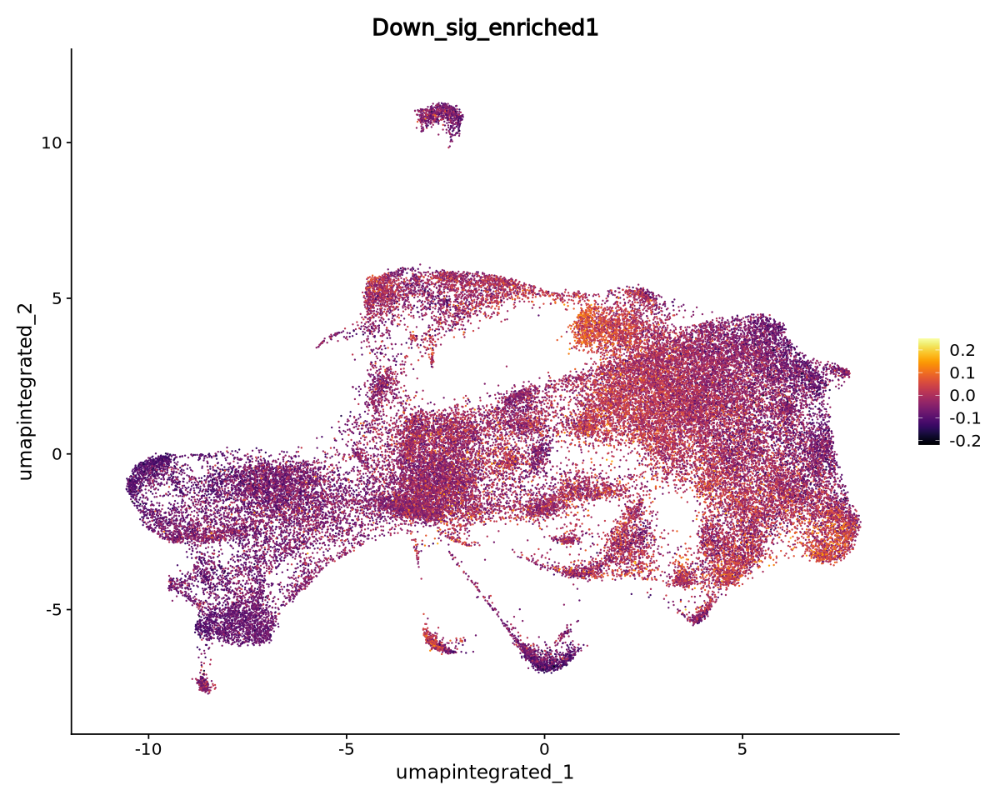

In [18]:
#Plot UMAP with module score
options(repr.plot.height=8, repr.plot.width=10)

FeaturePlot(Data, reduction = "umap.integrated", features = "Up_sig_enriched1", label = FALSE, repel = TRUE) +
            scale_colour_viridis(option="inferno")

FeaturePlot(Data, reduction = "umap.integrated", features = "Down_sig_enriched1", label = FALSE, repel = TRUE) +
            scale_colour_viridis(option="inferno")

In [19]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(Data, file = "/scratch/user/s4436039/scdata/2024-07-30_BREAST-integration/Integrated_BRE_annots.RDS")

#### Following the above then need to move entire folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/2024-07-30_BREAST-integration/ /QRISdata/Q5935/nikita/scdata/2024-07-30_BREAST-integration
```